***
***
# <div align="center"><font color='RED'><b>AREEBA FATAH </b></font></div>
***
# <div align="center"><font color='BLUE'><b>GENERATIVE AI</b></font></div>
***
# <div align="center"><font color='RED'><b>21I-0349</b></font></div>
***
# <div align="center"><font color='BLUE'><b>ASSIGNMENT 2</b></font></div>
***
# <div align="center"><font color='RED'><b>QUESTION 1 </b></font></div>
***
<br>

<div style="text-align: center;">
    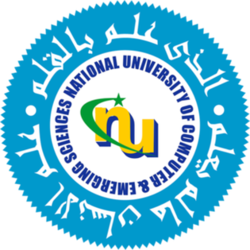
</div>

<br>

# IMPORTING THE REQUIRED LIBRARIES

In [1]:
import os
import cv2
import pickle
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision.utils import make_grid

# STEP 1: PREPARING THE DATASET 

## 1.1: LOADING AND PREPROCESSING THE DATA
In this block of code i have used the binarized signatures inspired by MNIST dataset, this was done by reading the simple signatures then <br> converting them to binary images.
Following is the detail of steps followed:<br>
<br>
1- Pytorch Class structure to ensure modularity in code. This class is responsible for reading ,retrieving and augmenting data.
<br>
<br>2- Loading Data function that reads data from the directory and binarize it using cv2 threshold
<br>
<br>3- Get item function to retrieve the image of of signatures
<br>
<br>4- Application of transforms to fulfill the data augmentation requirements i.e.<br>Scaling (x=0.8 and y=1.0), rotation (by 20 degrees) and Noise which is Gaussian random noise



In [34]:
class Sign_Data(Dataset):
    def __init__(self,base_dir,transform=None,noise_std=0.1):
        self.base_dir=base_dir
        self.transform=transform
        self.noise_std=noise_std
        self.signatures,self.labels=self.loading_sign_data(base_dir)

        
    def loading_sign_data(self,base_dir):
        signatures=[]
        labels=[]
        person_folders=[folder for folder in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir,folder))]
        for label,person_folder in enumerate(sorted(person_folders)):
            person_path=os.path.join(base_dir,person_folder)
            for file_name in os.listdir(person_path):
                if file_name.endswith('.png'):
                    sign_path=os.path.join(person_path,file_name)
                    sign=cv2.imread(sign_path,cv2.IMREAD_GRAYSCALE)
                    sign=cv2.resize(sign,(128,128))
                    _,sign_binary=cv2.threshold(sign,127,255,cv2.THRESH_BINARY)
                    signatures.append(sign_binary)
                    labels.append(label)
        signatures=np.array(signatures).reshape(-1,128,128,1)
        labels=np.array(labels)
        return signatures,labels

    
    def add_noise(self,image):
        noise=np.random.normal(0,self.noise_std*255,image.shape)
        noisy_image=np.clip(image+noise,0,255).astype(np.uint8)
        return noisy_image

    
    def __len__(self):
        return len(self.signatures)

    
    def __getitem__(self,idx):
        image=self.signatures[idx]
        label=self.labels[idx]
        image=self.add_noise(image)
        if self.transform:
            image=self.transform(image)
        return image,label


## 1.2 DATA AUGMENTATION
Apart from requirements binarization and normalization was also done.

In [76]:
sign_transform=transforms.Compose([transforms.ToPILImage(),
                                   transforms.RandomRotation(20),
                                   transforms.RandomResizedCrop(128,scale=(0.8,1.0)),
                                   transforms.ToTensor(),
                                   transforms.Normalize((0.5,),(0.5,)),
                                   transforms.Lambda(lambda x:x+0.05*torch.randn_like(x))
                                ])

## 1.3 DATA LOADING
Data was already privately made available on kaggle by me.

In [77]:
Sign_data=Sign_Data("/kaggle/input/signature-dataset/Signatures/",transform=sign_transform)
Train_size=int(0.8*len(Sign_data))
Test_size=len(Sign_data)-Train_size
Train_S_data,Test_S_data=random_split(Sign_data,[Train_size,Test_size])
Train_loader=DataLoader(Train_S_data,batch_size=64,shuffle=True)
Test_loader=DataLoader(Test_S_data,batch_size=64,shuffle=False)
print(f"Training samples: {len(Train_S_data)},Test samples: {len(Test_S_data)}")

Training samples: 588,Test samples: 148


***

# STEP 2: VARIATIONAL AUTO ENCODERS
Three parts i,e, Encoder, Decoder and VAE which combines both.

## 2.1 ENCODER
- **Total Layers**: 7 layers
  - 4 Convolutional layers
  - 2 Fully Connected layers (for mean and log variance)
  - 1 Dropout layer
- **Activation Functions**:
  - **ReLU**: Used in all Convolutional layers.
- **Dropout**: 
  - **Dropout Rate**: 0.3 used in the encoder.


In [100]:
class Encoder(nn.Module):
    def __init__(self,latent_dim=64):
        super(Encoder,self).__init__()
        self.conv=nn.Sequential(nn.Conv2d(1,32,kernel_size=4,stride=2,padding=1),
                                nn.ReLU(True),
                                nn.Conv2d(32,64,kernel_size=4,stride=2,padding=1),
                                nn.ReLU(True),
                                nn.Conv2d(64,128,kernel_size=4,stride=2,padding=1),
                                nn.ReLU(True),
                                nn.Conv2d(128,256,kernel_size=4,stride=2,padding=1),
                                nn.ReLU(True),
                                nn.Dropout(0.3)
                                )
        self.fc_latent_mean=nn.Linear(256*8*8,latent_dim)
        self.fc_latent_log_variance=nn.Linear(256*8*8,latent_dim)

    def forward(self,x):
        x=self.conv(x)
        x=x.view(x.size(0),-1)
        latent_mean=self.fc_latent_mean(x)
        latent_log_variance=self.fc_latent_log_variance(x)
        return latent_mean,latent_log_variance

## 2.2 DECODER
- **Total Layers**: 5 layers
  - 1 Fully Connected layer
  - 4 Transposed Convolutional layers
- **Activation Functions**:
  - **ReLU**: Used in all Transposed Convolutional layers except for the output layer.
  - **Sigmoid**: Used in the output layer to map outputs to the range [0, 1].
- **Dropout**:
  - **Dropout Rate**: 0.3 used in the decoder.


In [101]:
class Decoder(nn.Module):
    def __init__(self,latent_dim=64):
        super(Decoder,self).__init__()
        self.fc=nn.Linear(latent_dim,256*8*8)
        self.deconv=nn.Sequential(
                                    nn.ConvTranspose2d(256,128,kernel_size=4,stride=2,padding=1),
                                    nn.ReLU(True),
                                    nn.ConvTranspose2d(128,64,kernel_size=4,stride=2,padding=1),
                                    nn.ReLU(True),
                                    nn.ConvTranspose2d(64,32,kernel_size=4,stride=2,padding=1),
                                    nn.ReLU(True),
                                    nn.ConvTranspose2d(32,1,kernel_size=4,stride=2,padding=1),
                                    nn.Sigmoid(),
                                    nn.Dropout(0.3)
                                )

    def forward(self,z):
        z=self.fc(z).view(-1,256,8,8)
        return self.deconv(z)

## 2.3 VAE
Comprising of both encoder and decoder 

In [102]:
class VAE(nn.Module):
    def __init__(self,latent_dim=64):
        super(VAE,self).__init__()
        self.encoder=Encoder(latent_dim)
        self.decoder=Decoder(latent_dim)

    def forward(self,x):
        latent_mean,latent_log_variance=self.encoder(x)
        std=torch.exp(0.5*latent_log_variance)
        eps=torch.randn_like(std)
        z=latent_mean+eps*std
        return self.decoder(z),latent_mean,latent_log_variance

## 2.4 VAE LOSS AND RECONSTRUCTION VISUALIZER
#### VAE Loss Function
The vae_loss function calculates the total loss for VAE i.e mixture of reconstruction loss which is MSE and (KL) divergence which measures the difference between 2 distributions.

#### Visualize Reconstruction Function
The visualize_reconstruction function displays original and reconstructed images side by side for visual comparison fulfilling the requirements of the task.

In [103]:
# LOSS FUNCTION
def vae_loss(reconstructed,original,mu,logvar,beta=1.0):
    recon_loss=F.mse_loss(reconstructed,original,reduction='sum')
    kl_divergence=-0.5*torch.sum(1+logvar-mu.pow(2)-logvar.exp())
    return recon_loss+beta*kl_divergence


# SIDE BY SIDE VIEWING IMAGES AND RESCONSTRUCTED ONES
def visualize_reconstruction(original,reconstructed,epoch,num_images=8):
    original=original.cpu().detach().numpy()
    reconstructed=reconstructed.cpu().detach().numpy()
    plt.figure(figsize=(10,5))
    for i in range(num_images):
        plt.subplot(2,num_images,i+1)
        plt.imshow(original[i][0],cmap='gray')
        plt.axis('off')
    plt.title('Original Images')
    for i in range(num_images):
        plt.subplot(2,num_images,i+1+num_images)
        plt.imshow(reconstructed[i][0],cmap='gray')
        plt.axis('off')
    plt.title('Reconstructed Images')
    plt.suptitle(f'Epoch {epoch+1}')
    plt.show()

## 2.5 TRAINING
### Training Parameters

- **num_epochs**: 1000 
- **losses**: stored in list.
- **beta**: KL annealing factor initialized to 0, gradually increasing to 1.0 over the first 20 epochs.

In [107]:
loss_function=vae_loss
latent_dim=64
vae=VAE(latent_dim).to('cpu')
optimizer=optim.Adam(vae.parameters(),lr=0.0001,weight_decay=1e-5)
num_epochs=500
losses=[]
beta=0.0

Epoch [1/500], Loss: 7781.7102, Beta: 0.00


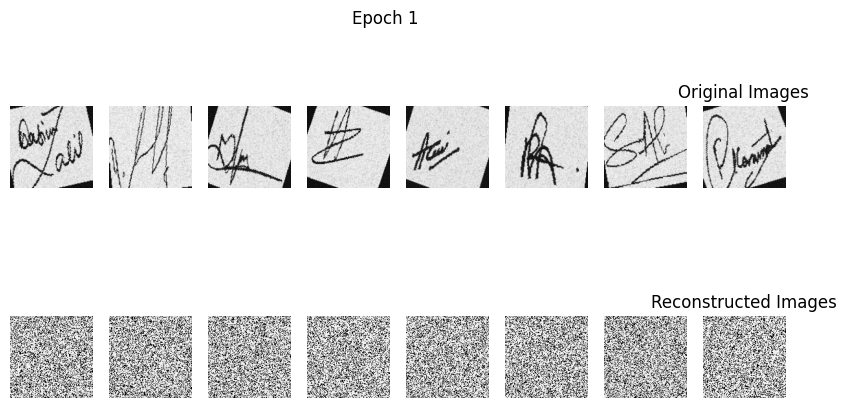

Epoch [101/500], Loss: 6374.1348, Beta: 1.00


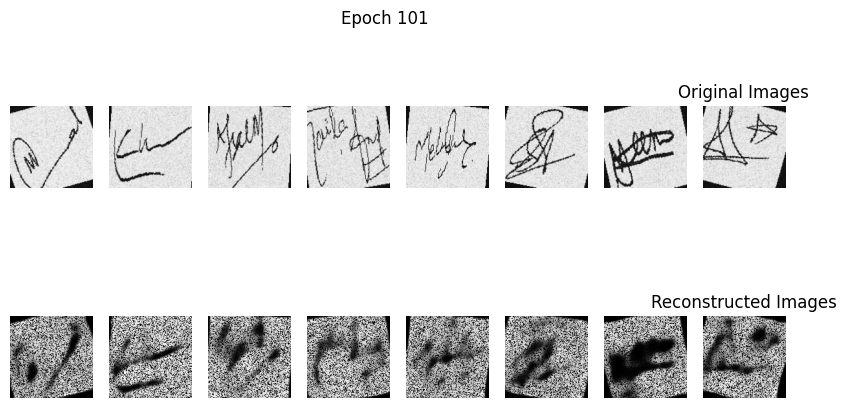

Epoch [201/500], Loss: 6283.4926, Beta: 1.00


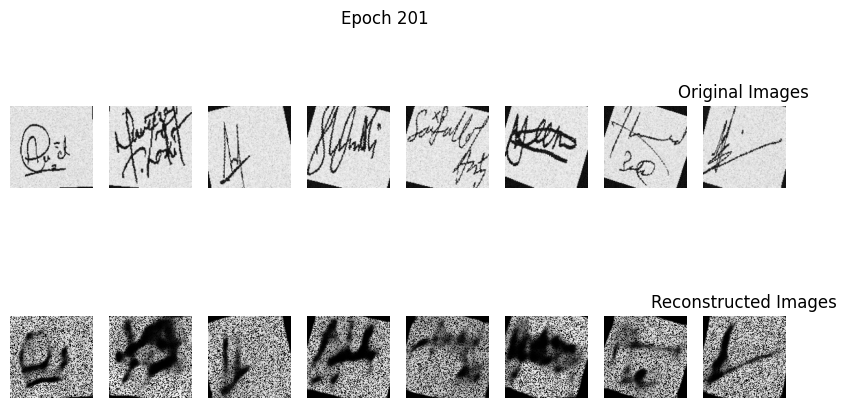

Epoch [301/500], Loss: 6200.6577, Beta: 1.00


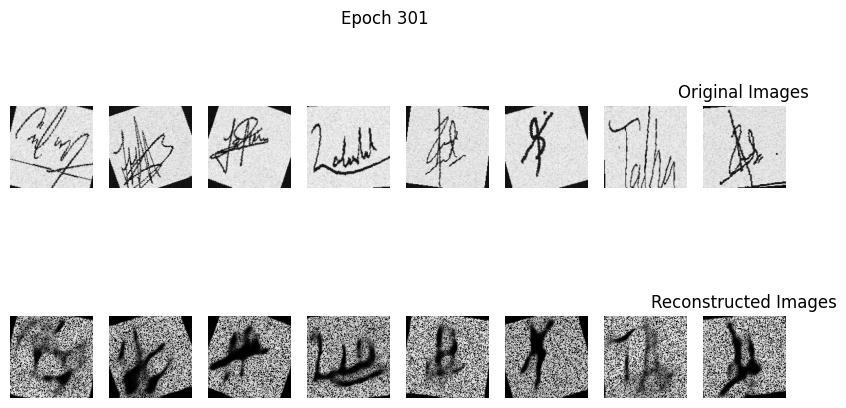

Epoch [401/500], Loss: 6163.5586, Beta: 1.00


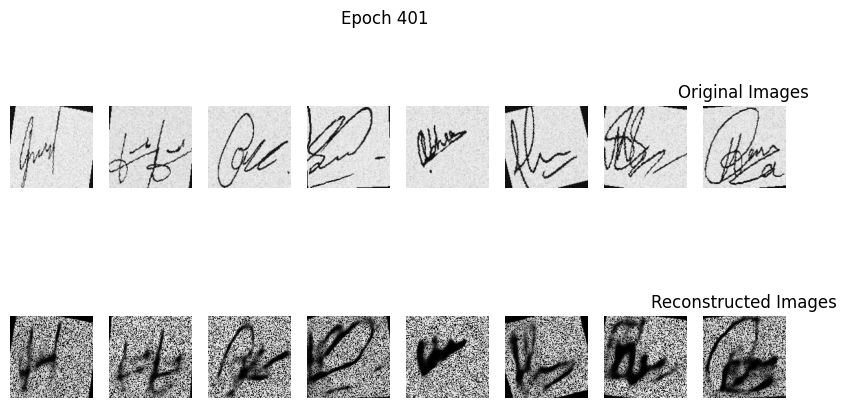

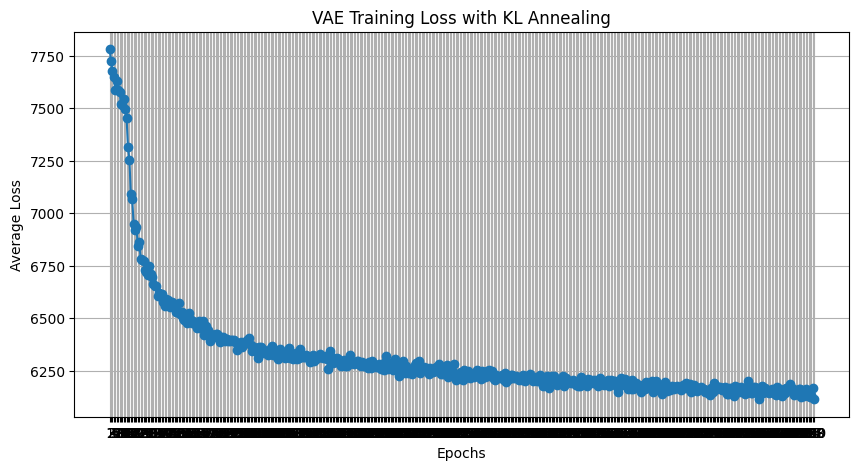

In [108]:
for epoch in range(num_epochs):
    vae.train()
    train_loss=0
    beta=min(1.0,epoch/20)
    for images,_ in Train_loader:
        images=images.to('cpu')
        reconstructed,mu,logvar=vae(images)
        loss=vae_loss(reconstructed,images,mu,logvar,beta)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss+=loss.item()
    average_loss=train_loss/len(Train_loader.dataset)
    losses.append(average_loss)
    if epoch%100==0:
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {average_loss:.4f}, Beta: {beta:.2f}")
        visualize_reconstruction(images[:8],reconstructed[:8],epoch)
plt.figure(figsize=(10,5))
plt.plot(range(1,num_epochs+1),losses,marker='o')
plt.title('VAE Training Loss with KL Annealing')
plt.xlabel('Epochs')
plt.ylabel('Average Loss')
plt.grid()
plt.xticks(range(1,num_epochs+1))
plt.show()

## 2.6 GENERATING NEW SIGNS
Just like the name suggests here i will be testing the VAE for new signatures just for my better understancing.

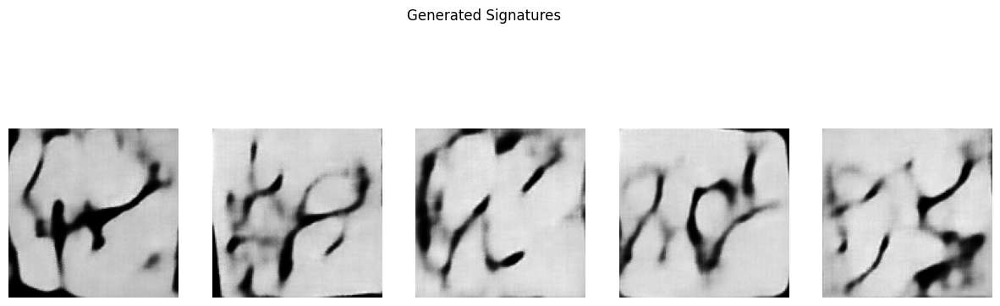

In [109]:
# 1- FOR PLOTTING THE IMAGES
def plot_with_pil(images,title="Generated Image"):
    plt.figure(figsize=(15,5))
    for idx,img in enumerate(images):
        img=(img.squeeze().cpu().numpy()*255).astype('uint8')
        plt.subplot(1,len(images),idx+1)
        plt.imshow(img,cmap='gray')
        plt.axis('off')
    plt.suptitle(title)
    plt.show()
    
    
# 2- FOR GENERATING NEW SIGNATURES
def generate_new_signatures(vae,num_samples=10,latent_dim=64):
    vae.eval()
    z=torch.randn(num_samples,latent_dim).to('cpu')
    with torch.no_grad():
        generated_images=vae.decoder(z)
    return generated_images

# RUNNER CODE
num_samples=5
generated_images=generate_new_signatures(vae,num_samples,latent_dim=64)
plot_with_pil(generated_images,title="Generated Signatures")

## 2.7 TESTING

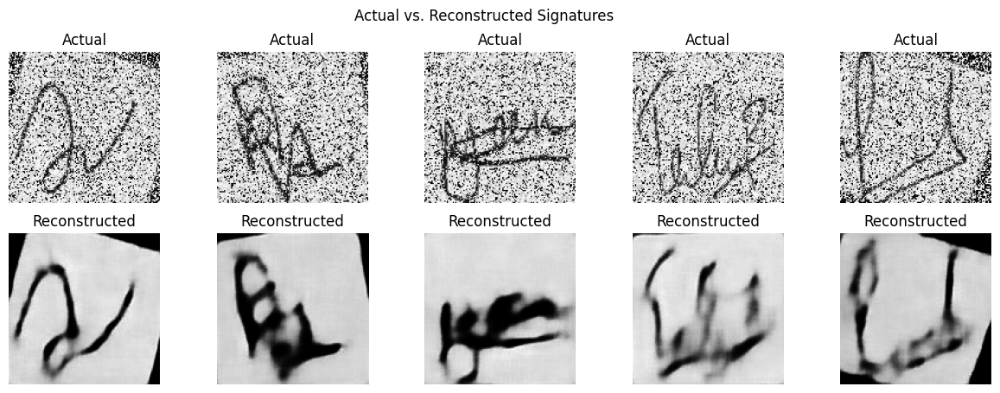

Average Reconstruction Loss on Test Set: 4012.4695


In [110]:
def test_vae(vae,test_loader):
    vae.eval()
    total_loss=0
    total_samples=0
    all_actual_images=[]
    all_reconstructed_images=[]
    with torch.no_grad():
        for images,_ in test_loader:
            images=images.to('cpu')
            reconstructed,mu,logvar=vae(images)
            loss=F.mse_loss(reconstructed,images,reduction='sum')
            total_loss+=loss.item()
            total_samples+=images.size(0)
            all_actual_images.append(images)
            all_reconstructed_images.append(reconstructed)
    avg_loss=total_loss/total_samples
    all_actual_images_flat=[img for batch in all_actual_images for img in batch]
    all_reconstructed_images_flat=[img for batch in all_reconstructed_images for img in batch]
    return avg_loss,all_actual_images_flat,all_reconstructed_images_flat

test_loss,actual_images,reconstructed_images=test_vae(vae,Test_loader)
num_samples=5
plot_actual_vs_reconstructed(actual_images[:num_samples],reconstructed_images[:num_samples],title="Actual vs. Reconstructed Signatures")
print(f"Average Reconstruction Loss on Test Set: {test_loss:.4f}")


***

# STEP 3: GANS

## 3.1 GENERATOR
- **Total Layers**: 
  - 5 layers
    - 4 Linear layers
    - 1 Tanh output layer
  
- **Activation Functions**: 
  - ReLU used for all hidden layers
  - Tanh used at the output to scale the generated images to the range \([-1, 1]\)

- **Output Shape**: 
  - Compatible with 128x128 grayscale images.

In [48]:
class Generator(nn.Module):
    def __init__(self,latent_dim=16,output_channels=1):
        super(Generator,self).__init__()
        self.fc=nn.Sequential(
            nn.Linear(latent_dim,256),
            nn.ReLU(True),
            nn.Linear(256,512),
            nn.ReLU(True),
            nn.Linear(512,1024),
            nn.ReLU(True),
            nn.Linear(1024,128*128),
            nn.Tanh()
        )

    def forward(self,z):
        z=self.fc(z)
        return z.view(-1,1,128,128)

## 3.2 DISCRIMINATOR
- **Total Layers**: 
  - 5 layers
    - 4 Linear layers
    - 1 Sigmoid output layer

- **Activation Functions**: 
  - LeakyReLU with a negative slope of 0.2 used for all hidden layers
  - Sigmoid used at the output to produce a probability score between 0 and 1

- **Input Shape**: 
  - Input images are flatenned from dimensions \(128 \times 128\) to a single dimension before processing.

In [49]:
class Discriminator(nn.Module):
    def __init__(self,input_channels=1):
        super(Discriminator,self).__init__()
        self.fc=nn.Sequential(
            nn.Linear(128*128,512),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Linear(512,256),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Linear(256,128),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Linear(128,1),
            nn.Sigmoid()
        )
    def forward(self,x):
        x=x.view(x.size(0),-1)
        return self.fc(x)

## 3.3 VISUALIZING AND GENERATING SAMPLES
Just like the name suggests, this is done to see the reconstruction in the training.

In [50]:
def generate_samples(generator,num_samples=10,latent_dim=16):
    generator.eval()
    z=torch.randn(num_samples,latent_dim).to('cpu')
    with torch.no_grad():
        generated_images=generator(z)
    return generated_images

def visualize_real_and_fake(real_imgs,fake_imgs,epoch):
    real_grid=make_grid(real_imgs,nrow=5,normalize=True)
    fake_grid=make_grid(fake_imgs,nrow=5,normalize=True)
    plt.figure(figsize=(15,10))
    plt.subplot(1,2,1)
    plt.imshow(real_grid.permute(1,2,0).cpu().numpy(),cmap='gray')
    plt.axis('off')
    plt.title('Real Images')
    plt.subplot(1,2,2)
    plt.imshow(fake_grid.permute(1,2,0).cpu().numpy(),cmap='gray')
    plt.axis('off')
    plt.title('Generated Images')
    plt.suptitle(f'Epoch {epoch+1}')
    plt.show()

## 3.4 TRAINING THE GAN

In [51]:
latent_dim=16
device="cuda" if torch.cuda.is_available() else "cpu"
generator=Generator(latent_dim=latent_dim).to(device)
discriminator=Discriminator().to(device)

In [62]:
def train_gan(generator,discriminator,dataloader,num_epochs=10,latent_dim=16):
    g_optimizer=torch.optim.Adam(generator.parameters(),lr=0.0002)
    d_optimizer=torch.optim.Adam(discriminator.parameters(),lr=0.002)
    criterion=nn.BCELoss()
    g_losses=[]
    d_losses=[]
    for epoch in range(num_epochs):
        for i,(real_imgs,_) in enumerate(dataloader):
            batch_size=real_imgs.size(0)
            real_imgs=real_imgs.to(device)
            real_labels=torch.full((batch_size,1),0.9).to(device)
            fake_labels=torch.zeros(batch_size,1).to(device)
            z=torch.randn(batch_size,latent_dim).to(device)
            fake_imgs=generator(z)
            if i%2==0:
                discriminator.zero_grad()
                outputs=discriminator(real_imgs)
                d_loss_real=criterion(outputs,real_labels)
                outputs=discriminator(fake_imgs.detach())
                d_loss_fake=criterion(outputs,fake_labels)
                d_loss=d_loss_real+d_loss_fake
                d_loss.backward()
                d_optimizer.step()
                d_losses.append(d_loss.item())
            else:
                generator.zero_grad()
                outputs=discriminator(fake_imgs)
                g_loss=criterion(outputs,real_labels)
                g_loss.backward()
                g_optimizer.step()
                g_losses.append(g_loss.item())
        if epoch%100==0:
            print(f'Epoch [{epoch+1}/{num_epochs}], D Loss: {d_loss.item()}')
            print(f'Epoch [{epoch+1}/{num_epochs}], G Loss: {g_loss.item()}')
            visualize_real_and_fake(real_imgs[:10],fake_imgs.detach()[:10],epoch)
    plt.figure(figsize=(10,5))
    plt.plot(d_losses,label='Discriminator Loss')
    plt.plot(g_losses,label='Generator Loss')
    plt.title('Losses During Training')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()


Epoch [1/500], D Loss: 27.4152889251709
Epoch [1/500], G Loss: 0.9383039474487305


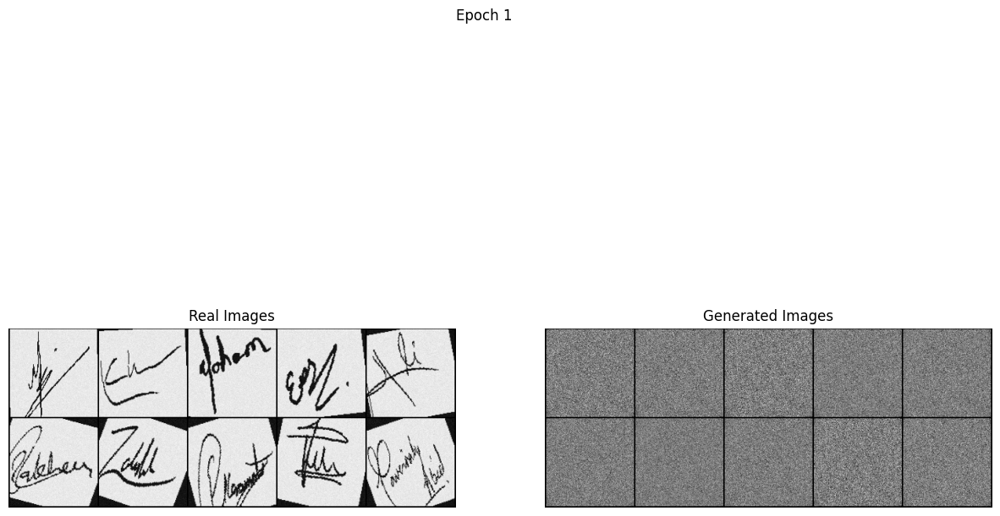

Epoch [101/500], D Loss: 1.182315707206726
Epoch [101/500], G Loss: 0.5781931281089783


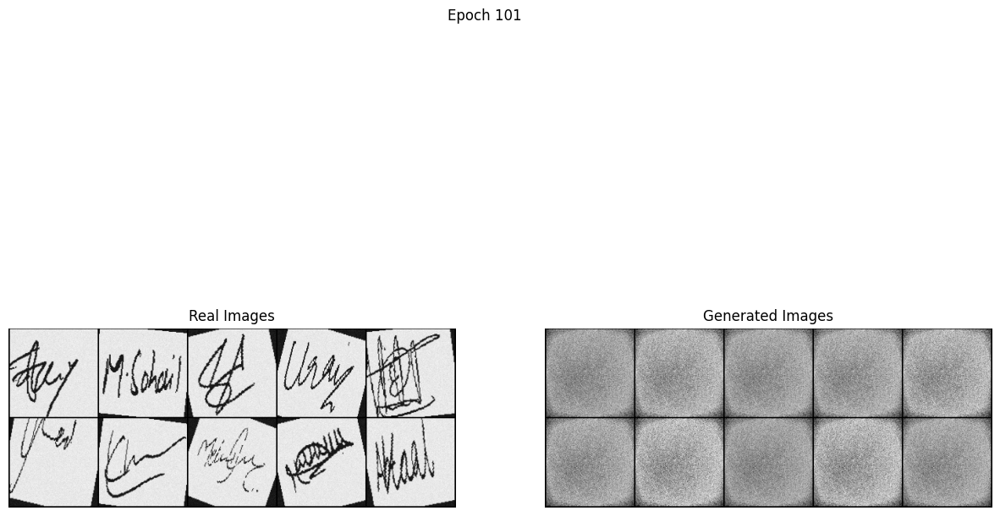

Epoch [201/500], D Loss: 1.2625503540039062
Epoch [201/500], G Loss: 3.6688780784606934


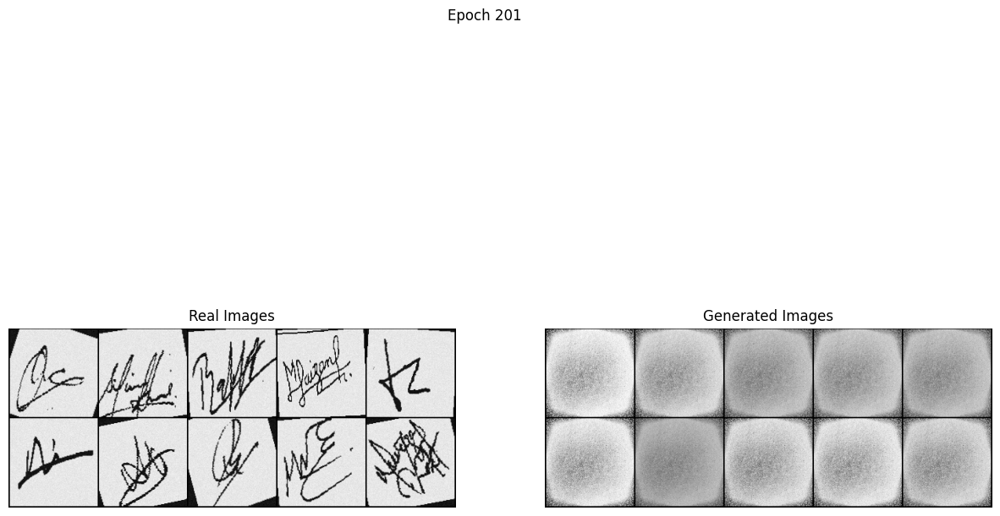

Epoch [301/500], D Loss: 1.2626757621765137
Epoch [301/500], G Loss: 1.5115222930908203


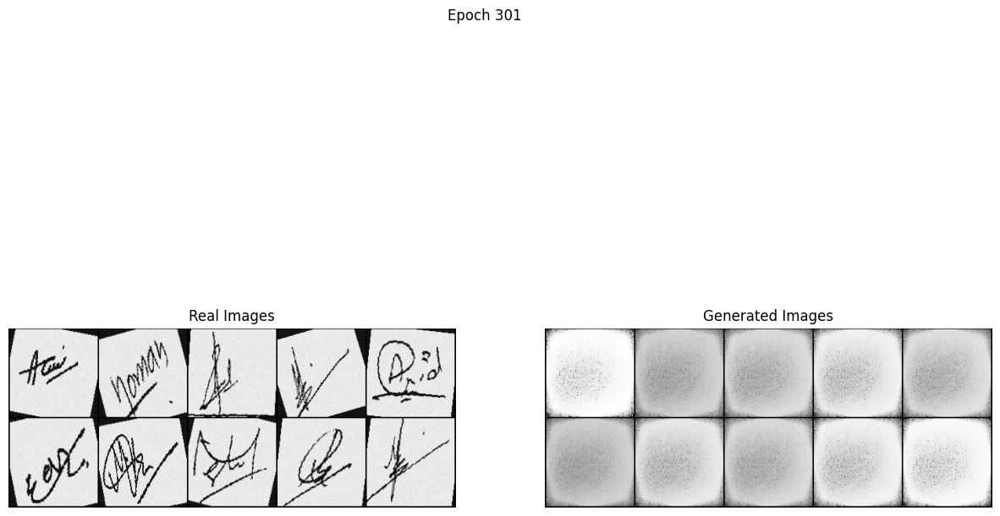

Epoch [401/500], D Loss: 0.76081782579422
Epoch [401/500], G Loss: 2.3190114498138428


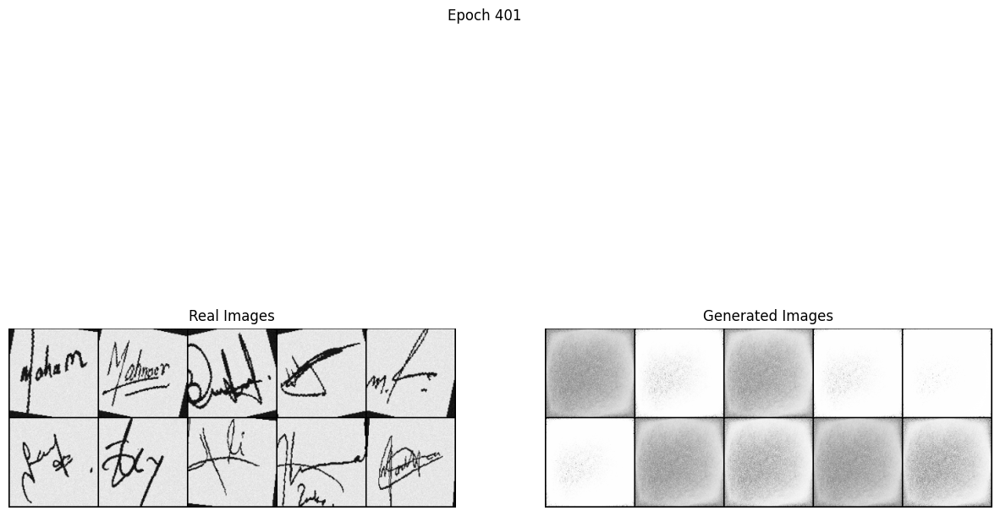

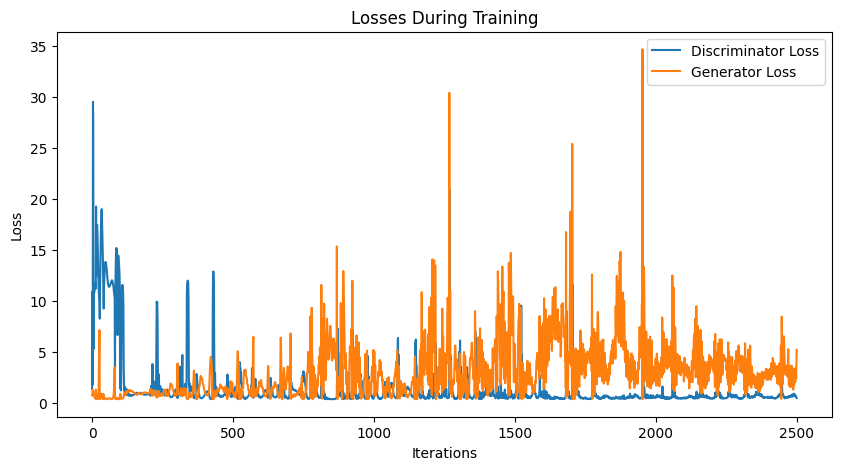

In [53]:
train_gan(generator,discriminator,Train_loader,num_epochs=500,latent_dim=16)

Epoch [1/500], D Loss: 1.5803892612457275
Epoch [1/500], G Loss: 1.258148193359375


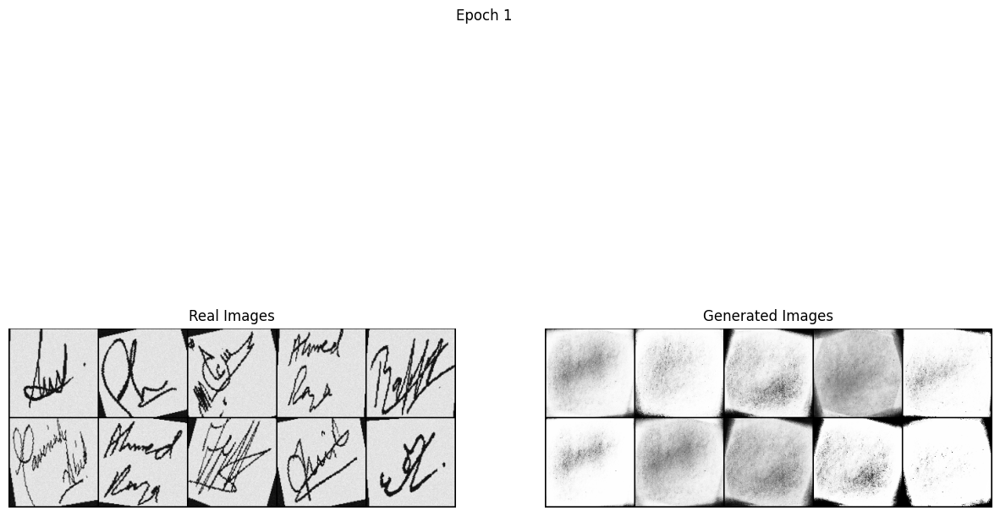

Epoch [101/500], D Loss: 0.723099410533905
Epoch [101/500], G Loss: 3.661247730255127


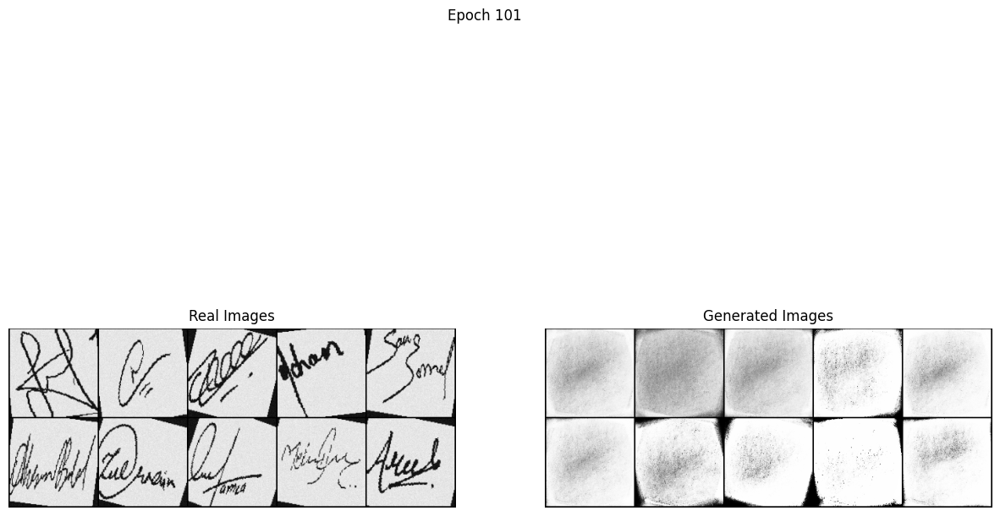

Epoch [201/500], D Loss: 0.5279867053031921
Epoch [201/500], G Loss: 2.7368106842041016


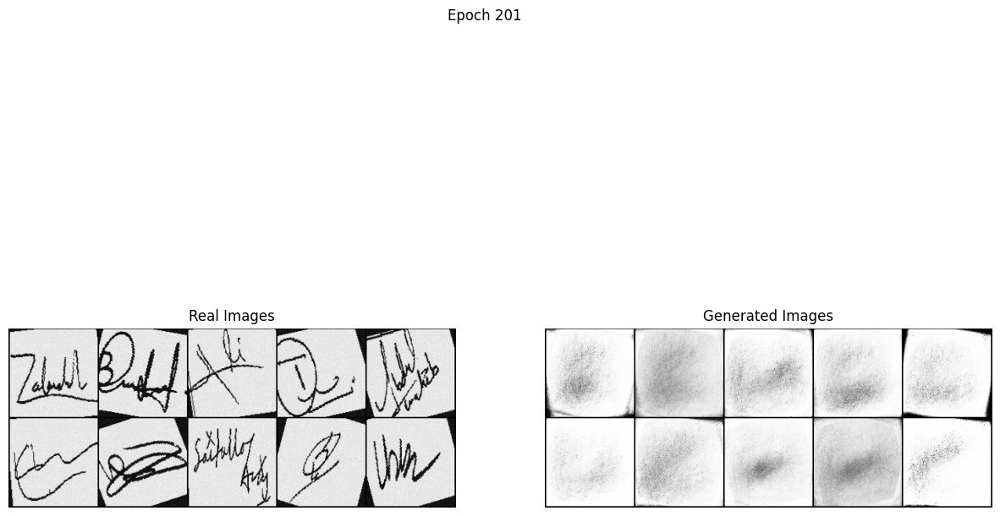

Epoch [301/500], D Loss: 0.9428437352180481
Epoch [301/500], G Loss: 10.744613647460938


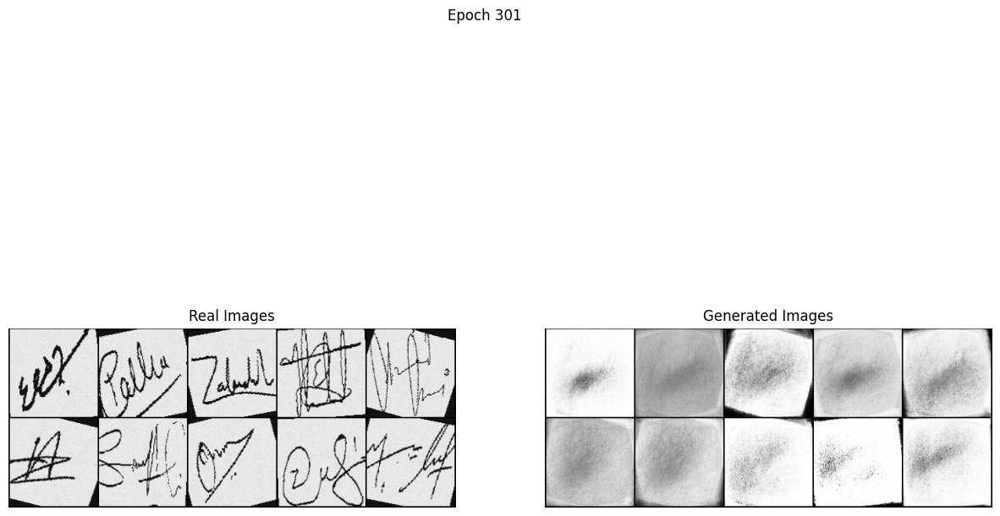

Epoch [401/500], D Loss: 1.71771240234375
Epoch [401/500], G Loss: 2.209683656692505


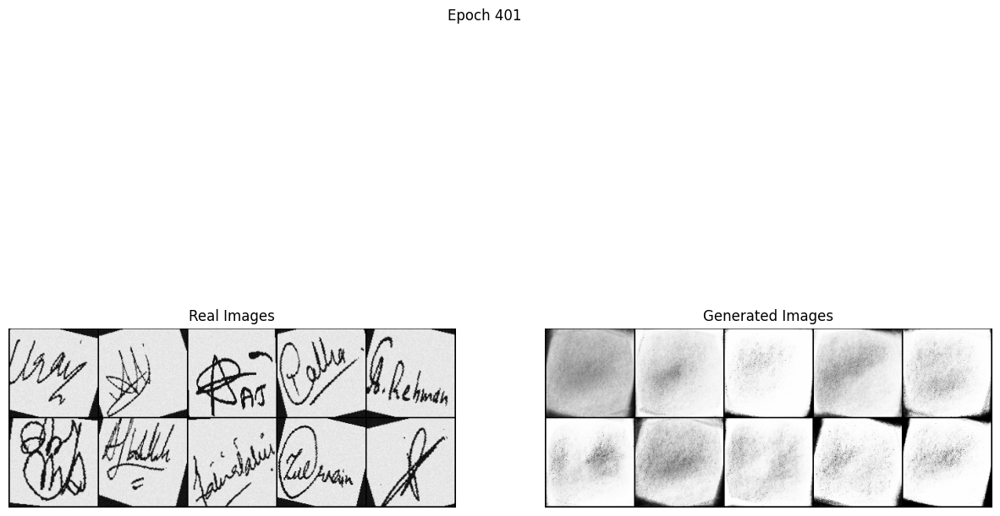

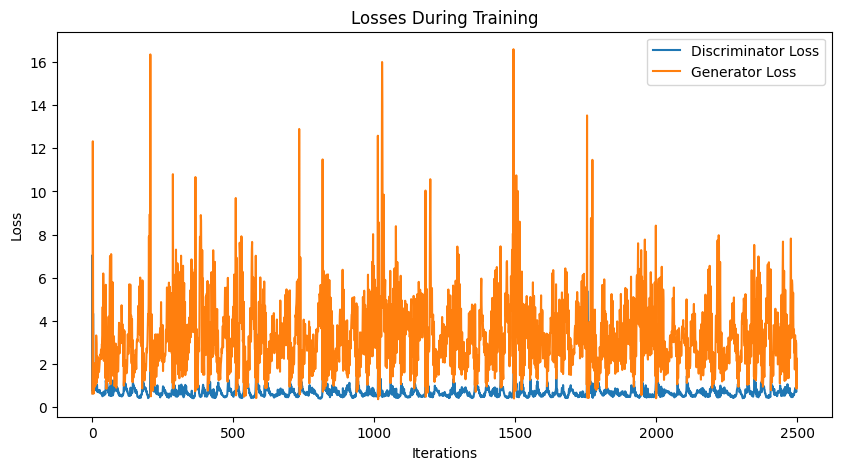

In [63]:
train_gan(generator,discriminator,Train_loader,num_epochs=500,latent_dim=16)

Epoch [1/500], D Loss: 3.2107481956481934
Epoch [1/500], G Loss: 2.5927674770355225


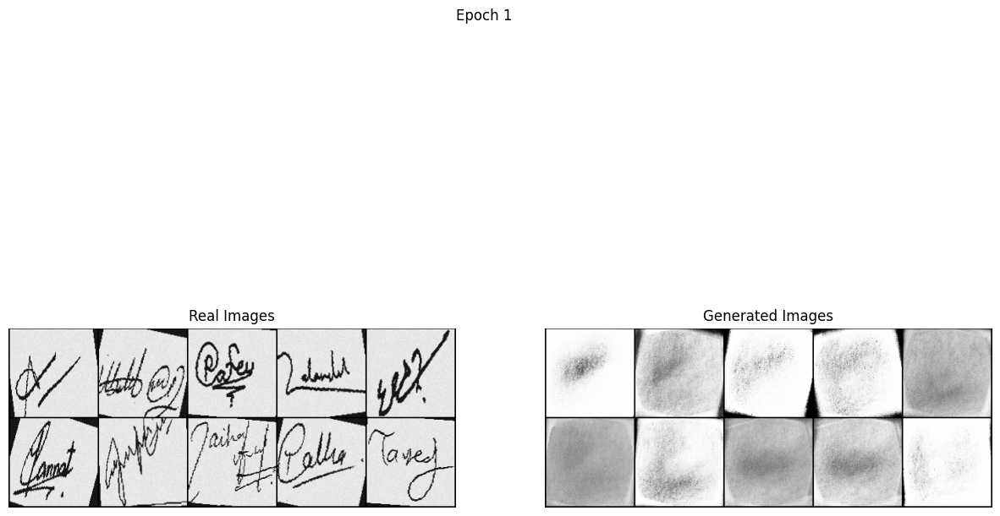

Epoch [101/500], D Loss: 0.5198871493339539
Epoch [101/500], G Loss: 2.313497304916382


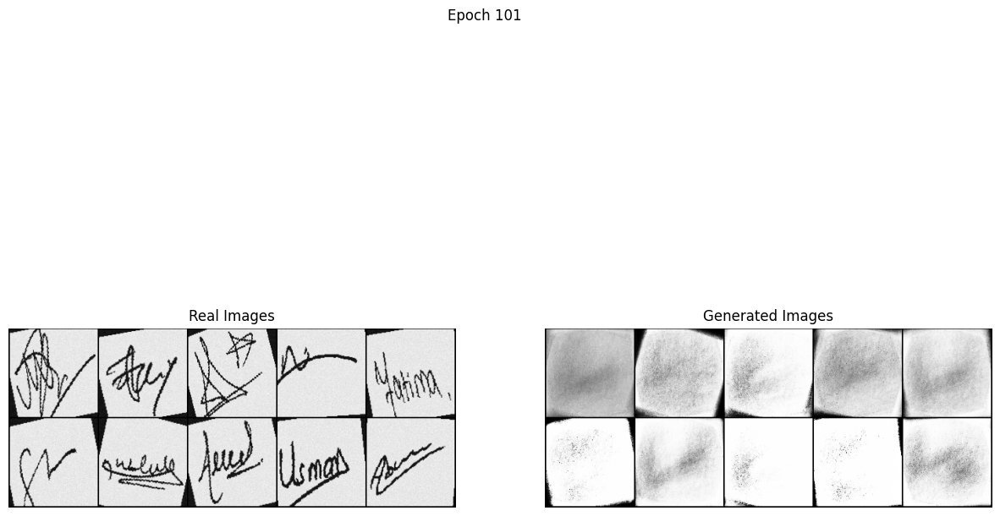

Epoch [201/500], D Loss: 0.5524760484695435
Epoch [201/500], G Loss: 3.973541021347046


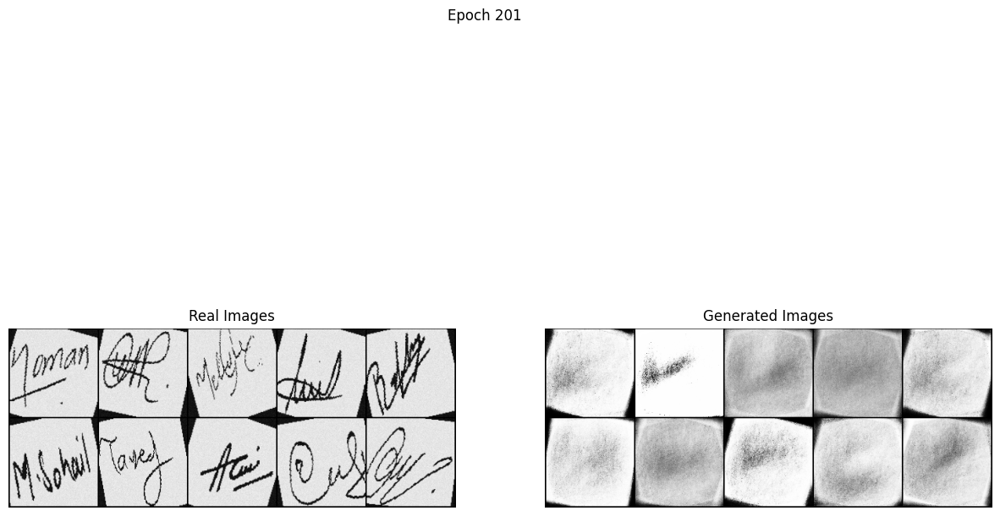

Epoch [301/500], D Loss: 0.8245611190795898
Epoch [301/500], G Loss: 5.46701717376709


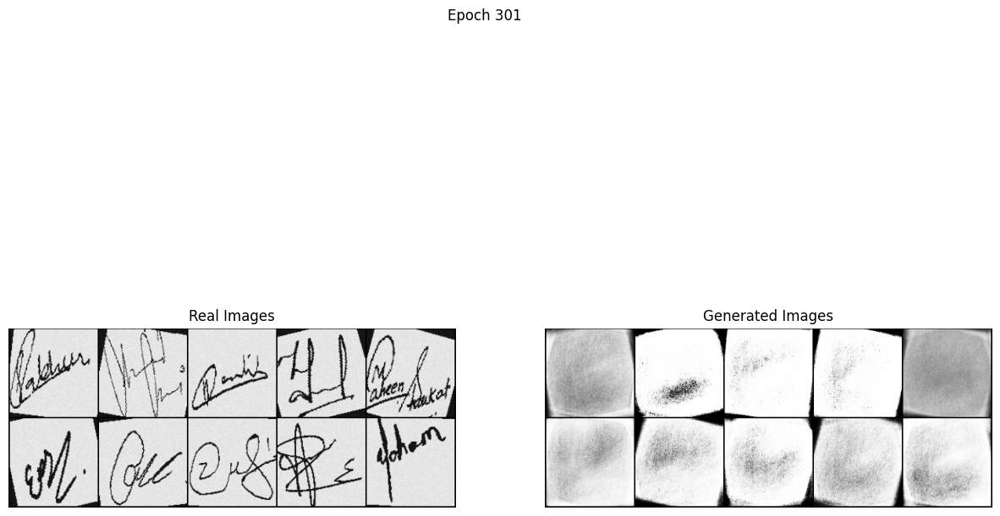

Epoch [401/500], D Loss: 0.5145351886749268
Epoch [401/500], G Loss: 5.094489097595215


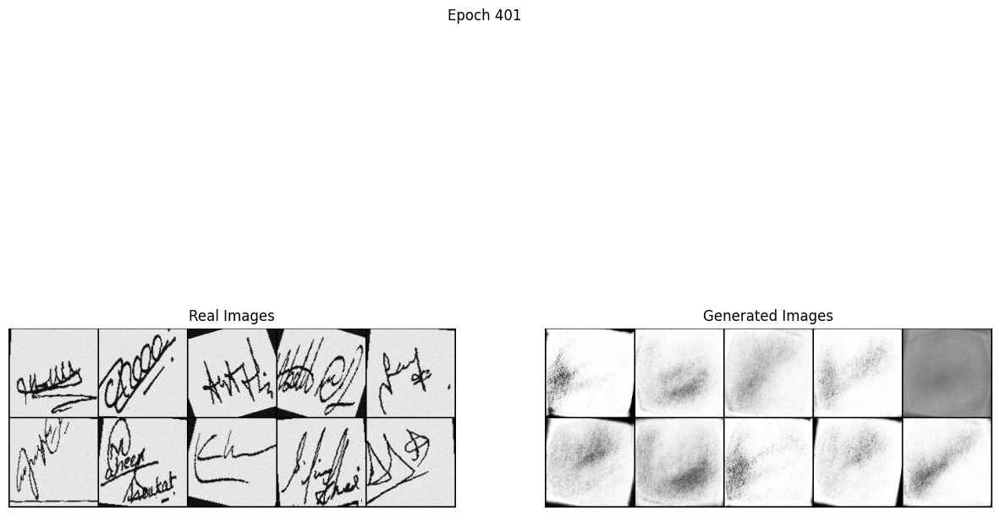

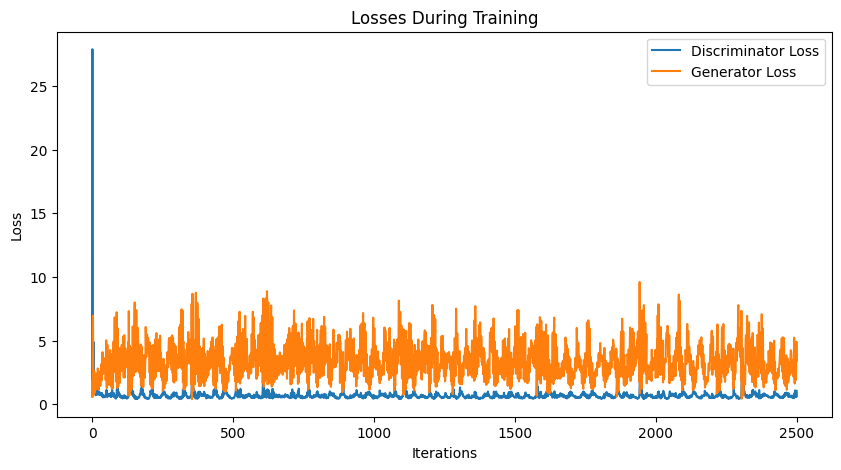

In [70]:
train_gan(generator,discriminator,Train_loader,num_epochs=500,latent_dim=16)

Epoch [1/500], D Loss: 2.3230466842651367
Epoch [1/500], G Loss: 0.4446573853492737


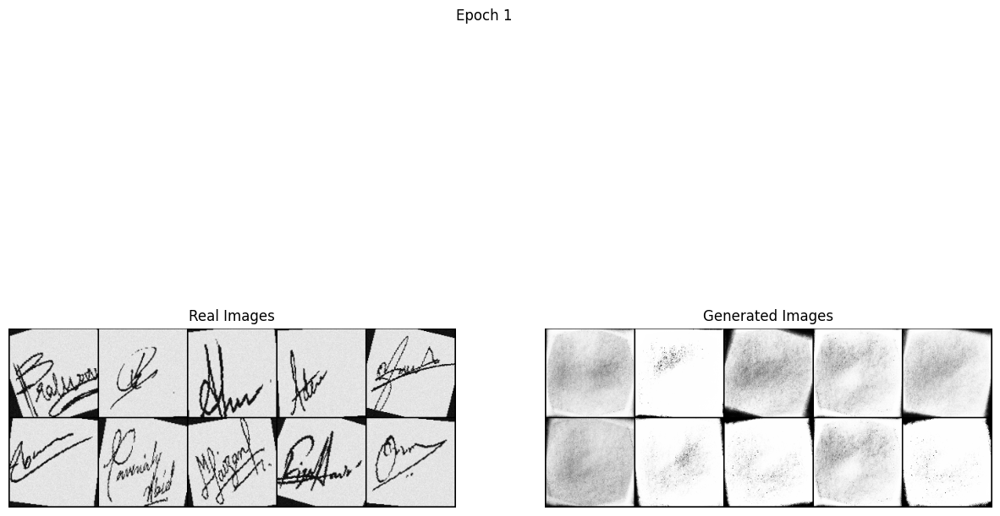

Epoch [101/500], D Loss: 0.712954044342041
Epoch [101/500], G Loss: 2.000215530395508


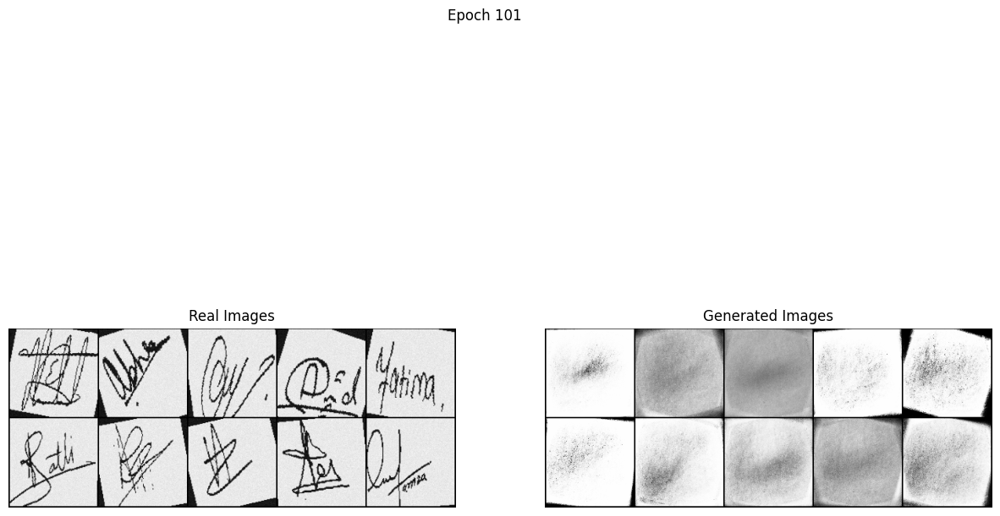

Epoch [201/500], D Loss: 0.5293575525283813
Epoch [201/500], G Loss: 3.805189847946167


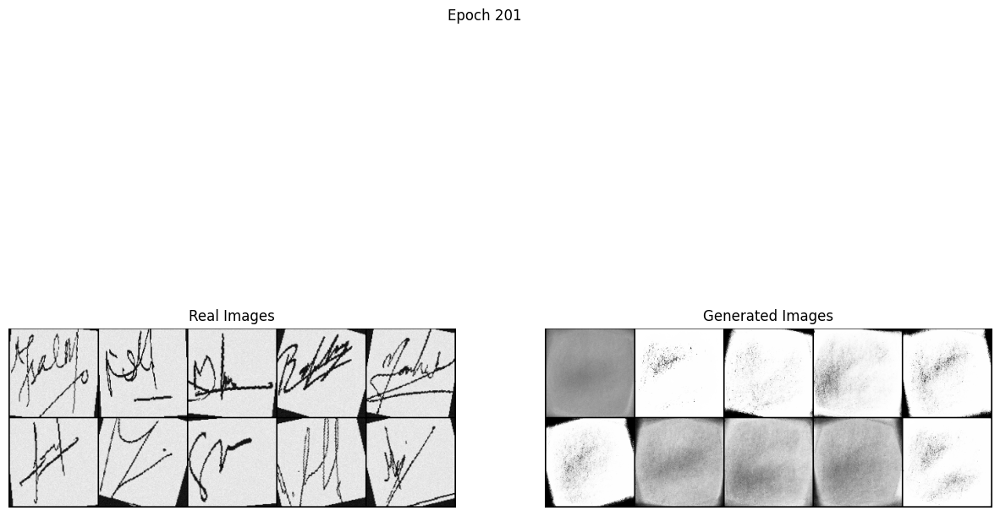

Epoch [301/500], D Loss: 0.6900278329849243
Epoch [301/500], G Loss: 2.809446334838867


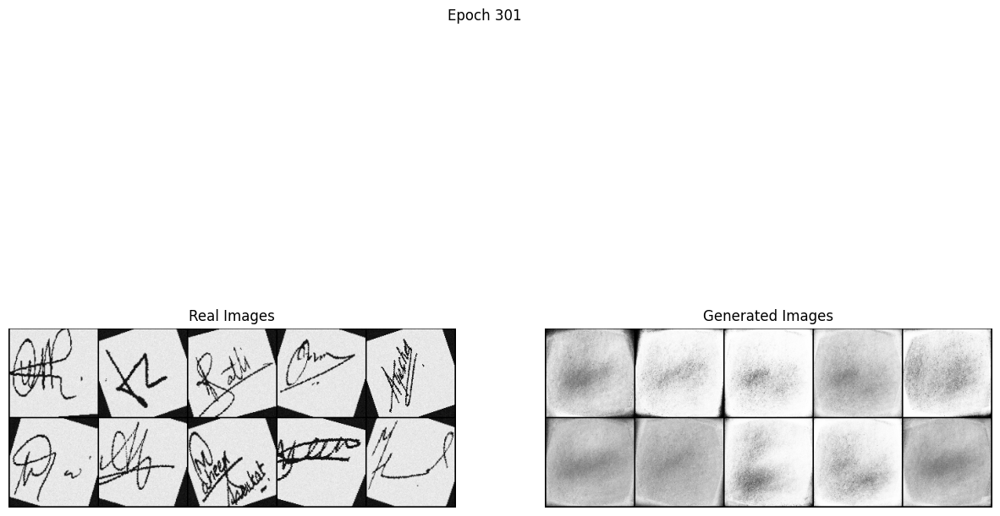

Epoch [401/500], D Loss: 0.5987383127212524
Epoch [401/500], G Loss: 3.486828327178955


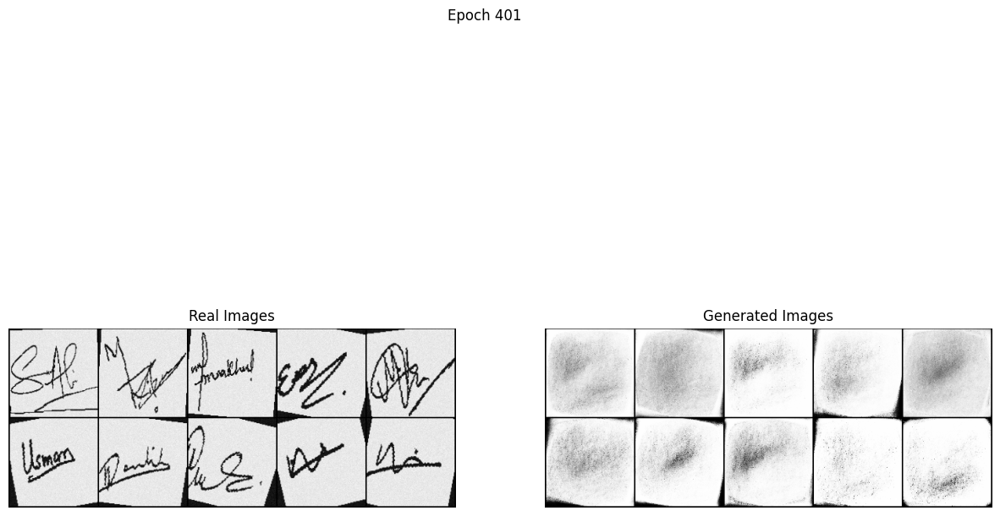

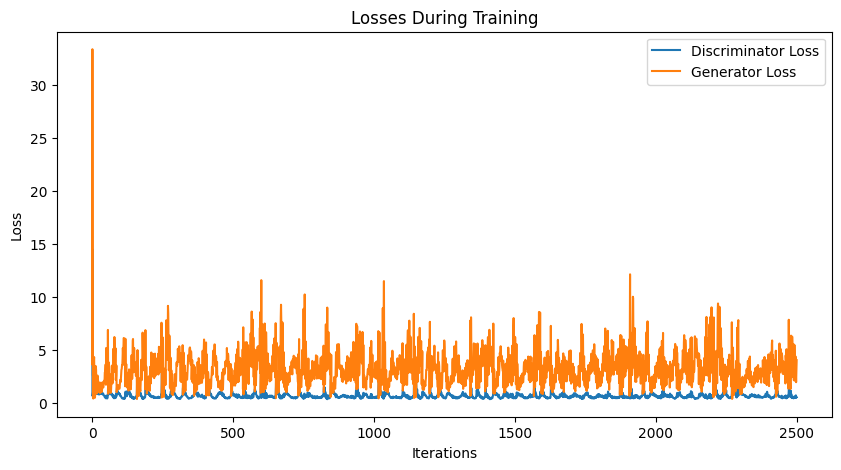

In [66]:
train_gan(generator,discriminator,Train_loader,num_epochs=500,latent_dim=16)

## 3.5 GENERATING NEW SIGNS

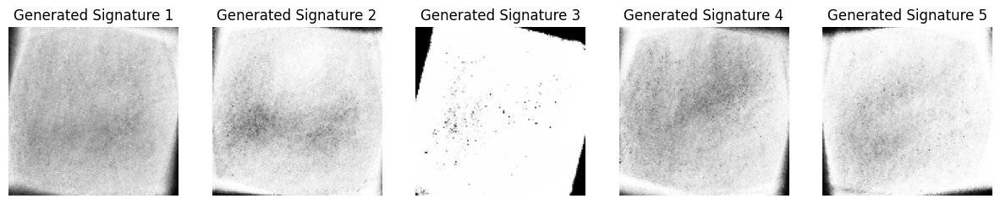

In [74]:
def plot_with_matplotlib(images,title="Generated Image"):
    plt.figure(figsize=(15,5))
    for idx,img in enumerate(images):
        img=(img.squeeze().cpu().numpy()*127.5+127.5).astype('uint8')
        plt.subplot(1,len(images),idx+1)
        plt.imshow(img,cmap='gray')
        plt.axis('off')
        plt.title(f"{title} {idx+1}")
    plt.show()

def generate_new_signatures(generator,num_samples,latent_dim=16):
    z=torch.randn(num_samples,latent_dim).to(next(generator.parameters()).device)
    with torch.no_grad():
        generated_images=generator(z)
    return generated_images

num_samples=5
generated_images=generate_new_signatures(generator,num_samples)
plot_with_matplotlib(generated_images,title="Generated Signature")

## 3.6 TESTING THE GANS

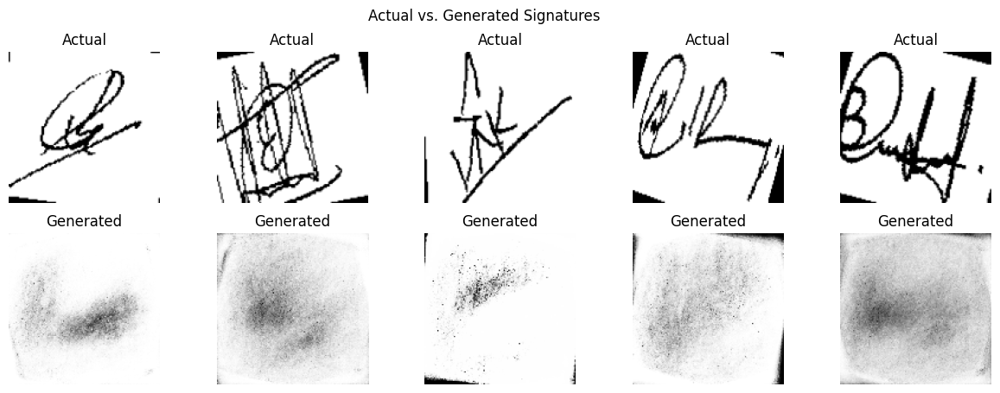

Average Generation Loss on Test Set: 7535.3822


In [80]:
def plot_actual_vs_generated(actual_images,generated_images,title="Actual vs. Generated"):
    plt.figure(figsize=(15,5))
    for idx in range(len(actual_images)):
        actual_img=(actual_images[idx].squeeze().cpu().numpy()*127.5+127.5).astype('uint8')
        generated_img=(generated_images[idx].squeeze().cpu().numpy()*127.5+127.5).astype('uint8')
        plt.subplot(2,len(actual_images),idx+1)
        plt.imshow(actual_img,cmap='gray')
        plt.axis('off')
        plt.title("Actual")
        plt.subplot(2,len(generated_images),idx+1+len(actual_images))
        plt.imshow(generated_img,cmap='gray')
        plt.axis('off')
        plt.title("Generated")
    plt.suptitle(title)
    plt.show()

def test_gan(generator,test_loader):
    generator.eval()
    total_loss=0
    total_samples=0
    all_actual_images=[]
    all_generated_images=[]
    with torch.no_grad():
        for images,_ in test_loader:
            images=images.to('cuda')
            z=torch.randn(images.size(0),latent_dim).to('cuda')
            generated=generator(z)
            loss=F.mse_loss(generated,images,reduction='sum')
            total_loss+=loss.item()
            total_samples+=images.size(0)
            all_actual_images.append(images)
            all_generated_images.append(generated)
    avg_loss=total_loss/total_samples
    all_actual_images_flat=[img for batch in all_actual_images for img in batch]
    all_generated_images_flat=[img for batch in all_generated_images for img in batch]
    return avg_loss,all_actual_images_flat,all_generated_images_flat
latent_dim=16
test_loss,actual_images,generated_images=test_gan(generator,Test_loader)
num_samples=5
plot_actual_vs_generated(actual_images[:num_samples],generated_images[:num_samples],title="Actual vs. Generated Signatures")
print(f"Average Generation Loss on Test Set: {test_loss:.4f}")

***

# STEP 4: SAVING AND LOADING MODELS
Functions for loading and saving the models

In [85]:
def save_model_to_pickle(model,filename):
    with open(filename,'wb') as file:
        pickle.dump(model,file)

def load_model_from_pickle(filename):
    with open(filename,'rb') as file:
        model=pickle.load(file)
    return model

In [ ]:
save_model_to_pickle(generator,'generator_model_1.pkl')
save_model_to_pickle(discriminator,'discriminator_model_1.pkl')
save_model_to_pickle(vae,'VAE.pkl')

In [84]:
generator=load_model_from_pickle('/kaggle/working/generator_model_1.pkl')
discriminator=load_model_from_pickle('/kaggle/working/discriminator_model_1.pkl')
vae=load_model_from_pickle('/kaggle/working/VAE.pkl')

# RESULTS:
GANS performance was bad than VAE. 

***

# <div style="text-align: center;">End</div>


***